https://seoyeonc.github.io/chch/cnn/feature%20extraction/big%20data%20analysis/2022/01/11/bd_9주차.html

https://seoyeonc.github.io/chch/cam/2022/01/10/bd-8주차_1.html

CNN으로 이미지 분류를 할 때 마지막 단의 출력값이 클수록 softmax를 거친 뒤 1에 가까워 진다면, 입력 이미지의 label에 해당하는 채널의 마지막 conv layer의 출력이 크게 하는 클래스에 크게 반응했다는 것이 됌..!

# import

In [1]:
import torch 
from fastai.vision.all import *
import cv2
import numpy as np
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageFile
from PIL import Image
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torchvision.utils import save_image
import os

In [2]:
import rpy2
import rpy2.robjects as ro 
from rpy2.robjects.vectors import FloatVector 
from rpy2.robjects.packages import importr

In [3]:
def label_func(f):
    if f[0].isupper():
        return 'cat' 
    else: 
        return 'dog' 

# 학습

In [4]:
path_r=Path('random_pet_one')   #랜덤박스넣은사진

In [5]:
files=get_image_files(path_r)

In [6]:
dls_r=ImageDataLoaders.from_name_func(path_r,files,label_func,item_tfms=Resize(512)) 

In [7]:
lrnr_r1=cnn_learner(dls_r,resnet34,metrics=error_rate)
lrnr_r1.fine_tune(1)

/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,0.131696,0.004259,0.002030,28:03


epoch,train_loss,valid_loss,error_rate,time
0,0.001016,0.000001,0.000000,36:23


In [8]:
net_1=lrnr_r1.model[0]
net_2=lrnr_r1.model[1] 

In [9]:
net_2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [10]:
net_r=torch.nn.Sequential(net_1,net_2)

In [11]:
lrnr_r2=Learner(dls_r,net_r,metrics=accuracy) 

In [12]:
lrnr_r2.fine_tune(10) 

epoch,train_loss,valid_loss,accuracy,time
0,0.010517,0.001304,0.999323,36:43


epoch,train_loss,valid_loss,accuracy,time
0,0.000014,0.000003,1.000000,36:15
1,0.000005,0.000005,1.000000,36:14
2,0.000001,0.000000,1.000000,32:47
3,0.000000,0.000000,1.000000,31:53
4,0.000000,0.000000,1.000000,36:17
5,0.000000,0.000000,1.000000,35:47
6,0.000000,0.000000,1.000000,35:50
7,0.000000,0.000000,1.000000,36:21
8,0.000000,0.000000,1.000000,36:21
9,0.000000,0.000000,1.000000,36:09


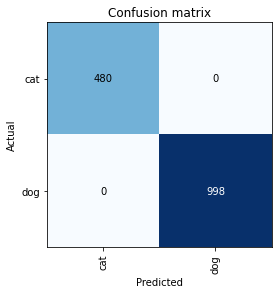

In [13]:
interp = ClassificationInterpretation.from_learner(lrnr_r2)
interp.plot_confusion_matrix()

In [1568]:
net_2[2].weight

Parameter containing:
tensor([[ 0.0440, -0.0577, -0.0187,  ...,  0.0355, -0.0320, -0.0247],
        [-0.0500,  0.0643, -0.0438,  ..., -0.0369,  0.0333,  0.0346]],
       requires_grad=True)

In [1569]:
dls_r.vocab

['cat', 'dog']

In [1567]:
net_1(x).shape, net_2[2].weight.shape

(torch.Size([1, 512, 16, 16]), torch.Size([2, 512]))

In [70]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[2])]))

In [71]:
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())

# Accuracy

In [ ]:
cat_acc_s = [] #고양이를 고양이라고 잘 맞춤
dog_acc_s = [] #강아지를 고양이라고 맞춤
cat_acc_f = [] #강아지를 강아지라고 잘 맞춤
dog_acc_f = [] #고양이를 강아지라고 맞춤

for i in range(len(path_res1.ls())) :
    x, = first(dls_r1.test_dl([PILImage.create(get_image_files(path_res1)[i])]))
    camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
    a,b = net_r(x).tolist()[0]
    catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
    if catprob>dogprob: 
        if label_func(str(list(path_res1.ls())[i]).split('/')[-1]) == 'cat' :
            cat_acc_s.append(catprob.round(5))
        else : 
            cat_acc_f.append(catprob.round(5))
    else:
        if label_func(str(list(path_res1.ls())[i]).split('/')[-1]) == 'dog' :
            dog_acc_s.append(dogprob.round(5))
        else : 
            dog_acc_f.append(dogprob.round(5))


In [1553]:
print(len(cat_acc_s))
print(len(cat_acc_f))
print(len(dog_acc_s))
print(len(dog_acc_f))

954
888
1125
50


In [1554]:
print(sum(cat_acc_s)/len(cat_acc_s) * 100)
print(sum(cat_acc_f)/len(cat_acc_f) * 100)

print(sum(dog_acc_s)/len(dog_acc_s) * 100)
print(sum(dog_acc_f)/len(dog_acc_f) * 100)

81.43121802935015
64.14542680180179
74.7282746666667
55.289880000000004


# Visualization

In [ ]:
# # 서연 수정 code
# fig, (ax1,ax2) = plt.subplots(1,2) 
# # 
# dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
# ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='spline36',cmap='magma')
# #
# dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
# ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='spline36',cmap='magma')
# fig.set_figwidth(8)            
# fig.set_figheight(8)
# fig.tight_layout()

In [ ]:
# fig, ax = plt.subplots(5,5) 
# k=0 
# for i in range(5):
#     for j in range(5): 
#         x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
#         camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
#         a,b = net_r(x).tolist()[0]
#         catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
#         if catprob>dogprob: 
#             dls_r.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
#             ax[i][j].imshow(camimg[0].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
#             ax[i][j].set_title("cat(%s)" % catprob.round(5))
#         else: 
#             dls_r.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
#             ax[i][j].imshow(camimg[1].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
#             ax[i][j].set_title("dog(%s)" % dogprob.round(5))
#         k=k+1 
# fig.set_figwidth(16)            
# fig.set_figheight(16)
# fig.tight_layout()

## thresholding point

<ipython-input-69-98bb7127f6af>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-69-98bb7127f6af>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-69-98bb7127f6af>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<ipy

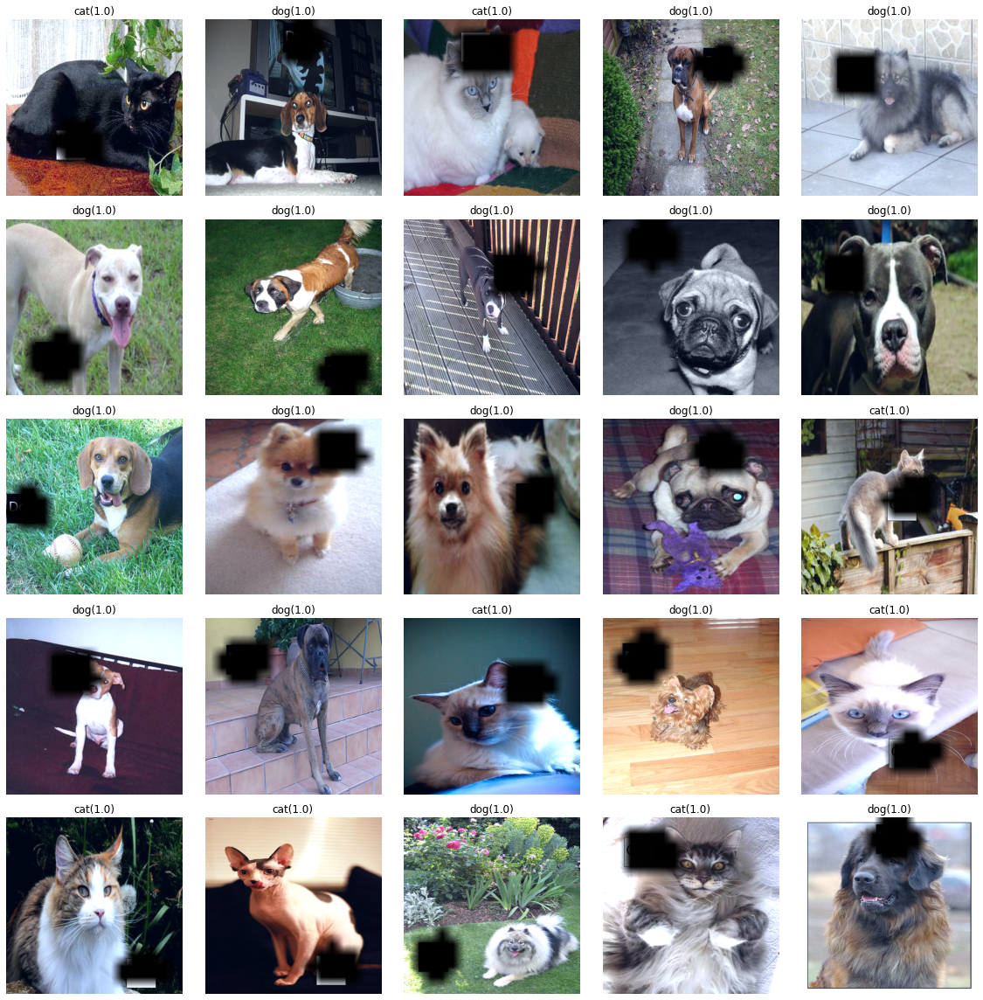

In [ ]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
        a,b = net_r(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
        ebayesthresh = importr('EbayesThresh').ebayesthresh
        power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
        ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
        power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
        ybar_threshed2 = np.where(power_threshed>2000,torch.tensor(camimg[1].detach().reshape(-1)),0)
        ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))
        ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))
        if catprob>dogprob: 
            # test=camimg[0]-torch.min(camimg[0])
            A1=torch.exp(-0.1*ybar_threshed)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            # test=camimg[1]-torch.min(camimg[1])
            A1=torch.exp(-0.1*ybar_threshed2)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

## ebayes X

In [64]:
# fig, ax = plt.subplots(5,5) 
# k=0 
# for i in range(5):
#     for j in range(5): 
#         x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
#         camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
#         a,b = net_r(x).tolist()[0]
#         catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
#         if catprob>dogprob: 
#             test=camimg[0]-torch.min(camimg[0])
#             A1=torch.exp(-0.1*test)
#             X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
#             Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
#             x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
#             (x1*0.25).squeeze().show(ax=ax[i][j])
#             ax[i][j].set_title("cat(%s)" % catprob.round(5))
#         else: 
#             test=camimg[1]-torch.min(camimg[1])
#             A1=torch.exp(-0.1*test)
#             X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
#             Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
#             x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
#             (x1*0.25).squeeze().show(ax=ax[i][j])
#             ax[i][j].set_title("dog(%s)" % dogprob.round(5))
#         k=k+1 
# fig.set_figwidth(16)            
# fig.set_figheight(16)
# fig.tight_layout()

# Step by step

# CAT

In [1513]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[2])]))

In [1514]:
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())

In [1515]:
ebayesthresh = importr('EbayesThresh').ebayesthresh

power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))

power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
ybar_threshed2 = np.where(power_threshed2>1600,torch.tensor(camimg[1].detach().reshape(-1)),0)
ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))

<ipython-input-1515-17c991cf797e>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-1515-17c991cf797e>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-1515-17c991cf797e>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<

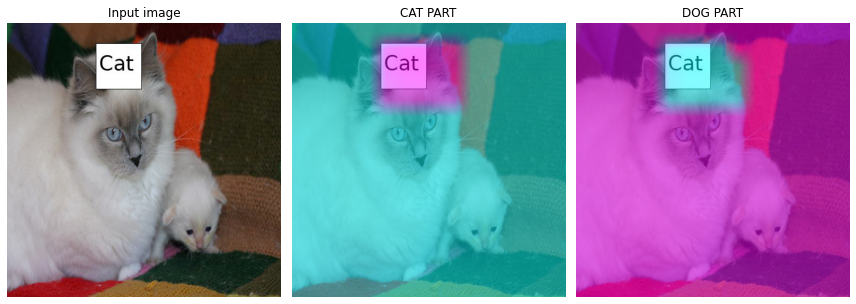

In [1516]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("Input image")
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow((ybar_threshed).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("CAT PART")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax3)
ax3.imshow((ybar_threshed2).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax3.set_title("DOG PART")
#
fig.set_figwidth(12)            
fig.set_figheight(12)
fig.tight_layout()

- 판단 근거가 강할 수록 파란색 -> 보라색

In [1517]:
a,b = net_r(x).tolist()[0]

In [1518]:
np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))

(0.9999999993947428, 6.052572469580072e-10)

## mode 1

In [1519]:
# test=camimg_o[0]-torch.min(camimg_o[0])
T = camimg[0]
A1=torch.exp(-0.05*(ybar_threshed))
T1 = torch.exp(-0.05*T)
A2 = 1 - A1
T2 = 1 - T1

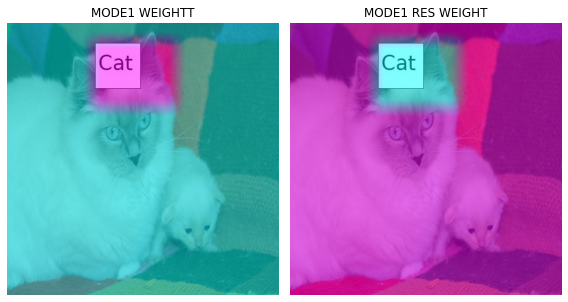

In [1520]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(A2.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("MODE1 WEIGHTT")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(A1.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("MODE1 RES WEIGHT")
#
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1521]:
# mode 1 res
X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1

# mode 1
X12=np.array(A2.to("cpu").detach(),dtype=np.float32)
Y12=torch.Tensor(cv2.resize(X12,(512,512),interpolation=cv2.INTER_LINEAR))
x12=x.squeeze().to('cpu')*Y12-torch.min(x.squeeze().to('cpu'))*Y12

`-` 1st CAM 분리

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


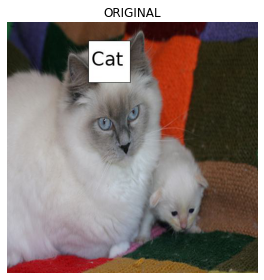

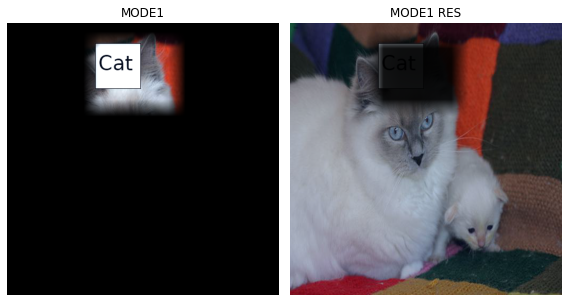

In [1522]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.2).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1523]:
x1 = x1.reshape(1,3,512,512)

In [1524]:
net_1.to('cpu')
net_2.to('cpu')

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [1525]:
camimg1 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x1).squeeze())

In [1526]:
a1,b1 = net_r(x1).tolist()[0]

In [1527]:
np.exp(a1)/ (np.exp(a1)+np.exp(b1)) ,  np.exp(b1)/ (np.exp(a1)+np.exp(b1))

(0.9986731335173454, 0.0013268664826546232)

`-` mode1 res 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


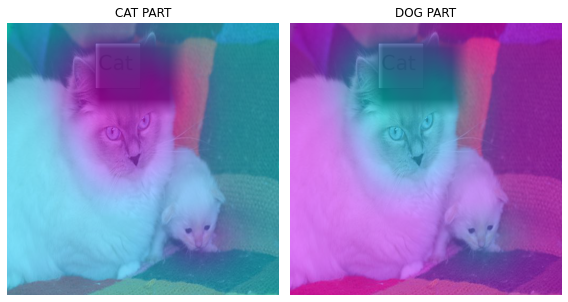

In [1528]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
(x1*0.25).squeeze().show(ax=ax1)
ax1.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
(x1*0.25).squeeze().show(ax=ax2)
ax2.imshow(camimg1[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

`-` 첫번째 CAM 결과와 비교

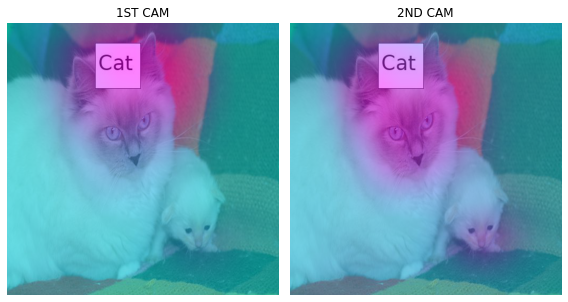

In [1529]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("1ST CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("2ND CAM")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

`-` 2nd CAM 분리

In [1530]:
test1=camimg1[0]-torch.min(camimg1[0])
A3 = torch.exp(-0.03*(test1))
A4 = 1 - A3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


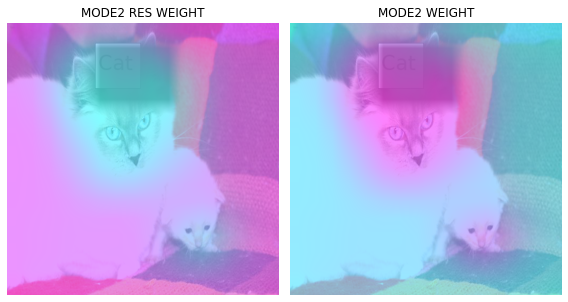

In [1531]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
x1.squeeze().show(ax=ax2)
dls_r.train.decode((x1,))[0].squeeze().show(ax=ax1)
ax1.imshow(A3.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("MODE2 RES WEIGHT")
#
x1.squeeze().show(ax=ax2)
dls_r.train.decode((x1,))[0].squeeze().show(ax=ax2)
ax2.imshow(A4.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("MODE2 WEIGHT")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1532]:
X2=np.array(A3.to("cpu").detach(),dtype=np.float32)

Y2=torch.Tensor(cv2.resize(X2,(512,512),interpolation=cv2.INTER_LINEAR))

x2=(x1*0.2)*Y2-torch.min((x1*0.2)*Y2)

X22=np.array(A4.to("cpu").detach(),dtype=np.float32)

Y22=torch.Tensor(cv2.resize(X22,(512,512),interpolation=cv2.INTER_LINEAR))

x22=(x1*0.2)*Y22-torch.min((x1*0.2)*Y22)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


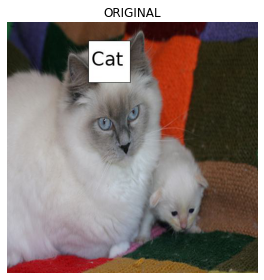

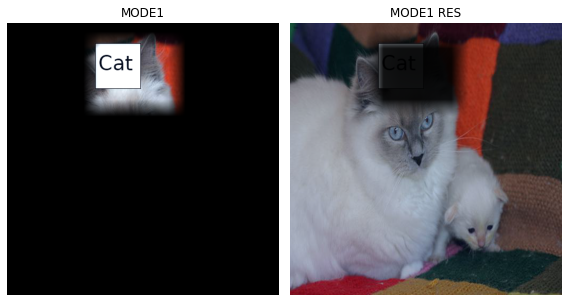

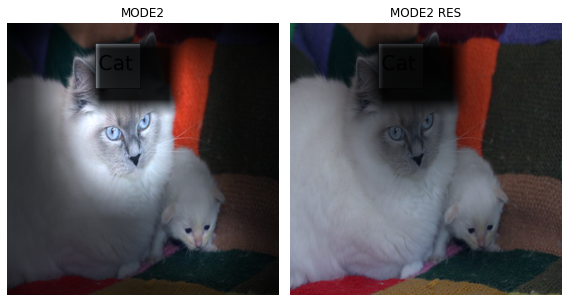

In [1533]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.2).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x22*4).squeeze().show(ax=ax1)  #MODE2
(x2).squeeze().show(ax=ax2)  #MODE2_res
ax1.set_title("MODE2")
ax2.set_title("MODE2 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1534]:
x2 = x2.reshape(1,3,512,512)

In [1535]:
net_1.to('cpu')
net_2.to('cpu')

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [1536]:
camimg2 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x2).squeeze())

In [1537]:
a2,b2 = net_r(x2).tolist()[0]
np.exp(a2)/(np.exp(a2)+np.exp(b2)), np.exp(b2)/(np.exp(a2)+np.exp(b2))

(0.538050281567858, 0.461949718432142)

`-` mode2 res 에 CAM 결과 올리기

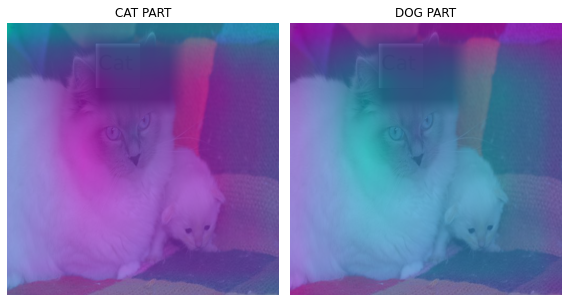

In [1538]:
fig, (ax1, ax2) = plt.subplots(1,2) 
#
x2.squeeze().show(ax=ax1)
ax1.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
x2.squeeze().show(ax=ax2)
ax2.imshow(camimg2[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

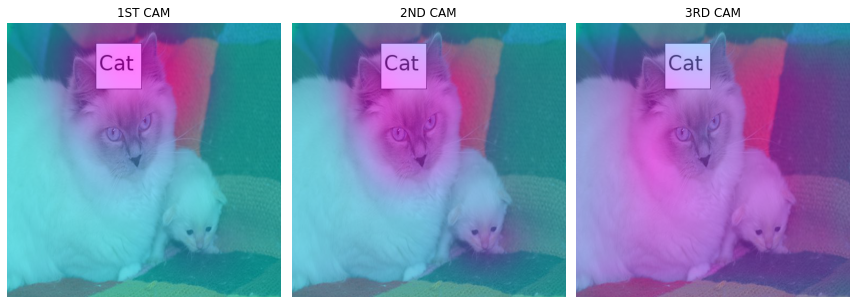

In [1539]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("1ST CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("2ND CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax3)
ax3.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax3.set_title("3RD CAM")
fig.set_figwidth(12)            
fig.set_figheight(12)
fig.tight_layout()

## mode 3 만들기

In [1540]:
test2=camimg2[0]-torch.min(camimg2[0])

In [1541]:
A5 = torch.exp(-0.05*(test2))

In [1542]:
A6 = 1 - A5

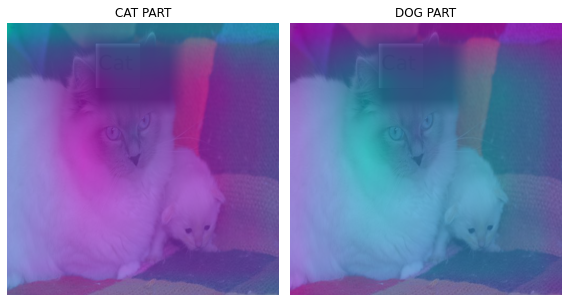

In [1543]:
fig, (ax1, ax2) = plt.subplots(1,2) 
#
x2.squeeze().show(ax=ax1)
ax1.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
x2.squeeze().show(ax=ax2)
ax2.imshow(camimg2[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1544]:
#mode 3 res
X3=np.array(A5.to("cpu").detach(),dtype=np.float32)
Y3=torch.Tensor(cv2.resize(X3,(512,512),interpolation=cv2.INTER_LINEAR))
x3=x2*Y3-torch.min(x2*Y3)
# mode 3
X32=np.array(A6.to("cpu").detach(),dtype=np.float32)
Y32=torch.Tensor(cv2.resize(X32,(512,512),interpolation=cv2.INTER_LINEAR))
x32=x2*Y32-torch.min(x2*Y32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


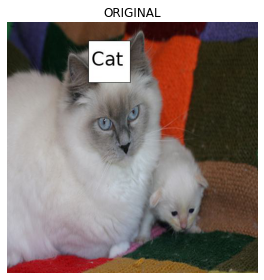

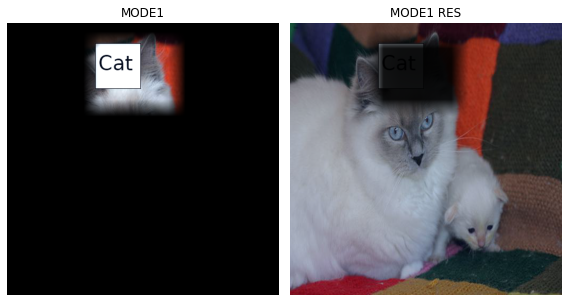

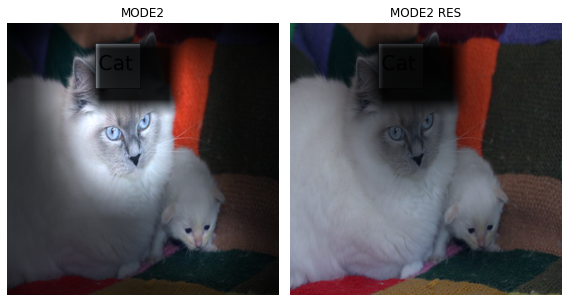

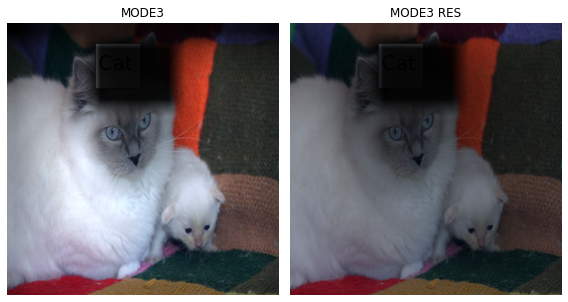

In [1545]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.2).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x22*4).squeeze().show(ax=ax1)  #MODE2
(x2).squeeze().show(ax=ax2)  #MODE2_res
ax1.set_title("MODE2")
ax2.set_title("MODE2 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x32*8).squeeze().show(ax=ax1)  #MODE3
(x3).squeeze().show(ax=ax2)  #MODE3_res
ax1.set_title("MODE3")
ax2.set_title("MODE3 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


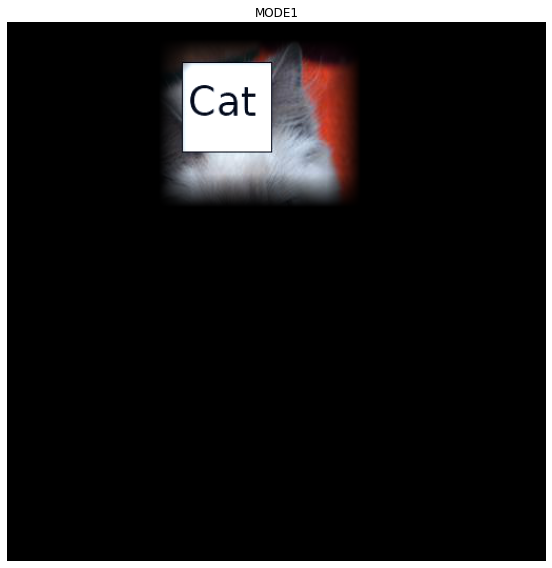

In [1546]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
ax1.set_title("MODE1")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


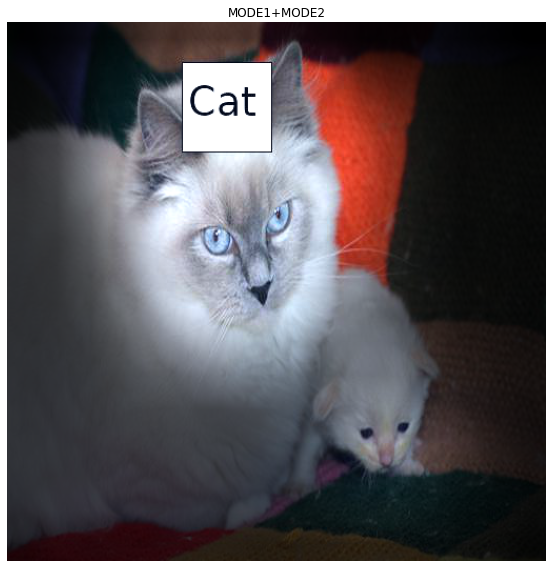

In [1547]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3 + x22*4).squeeze().show(ax=ax1)  #MODE1+MODE2
ax1.set_title("MODE1+MODE2")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


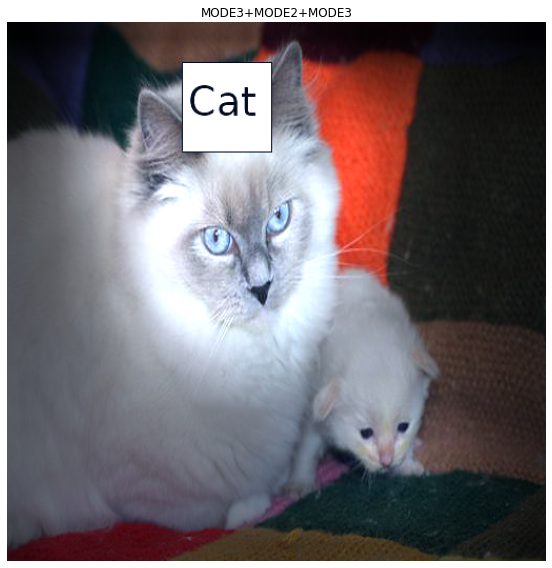

In [1548]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3 + x22*4 + x32*2).squeeze().show(ax=ax1)  #MODE1+MODE2+MODE3
ax1.set_title("MODE3+MODE2+MODE3")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

# DOG

In [1474]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[12])]))

In [1475]:
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())

In [1476]:
ebayesthresh = importr('EbayesThresh').ebayesthresh

power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))

power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
ybar_threshed2 = np.where(power_threshed2>1500,torch.tensor(camimg[1].detach().reshape(-1)),0)
ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))

<ipython-input-1476-087f3789280b>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-1476-087f3789280b>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-1476-087f3789280b>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<

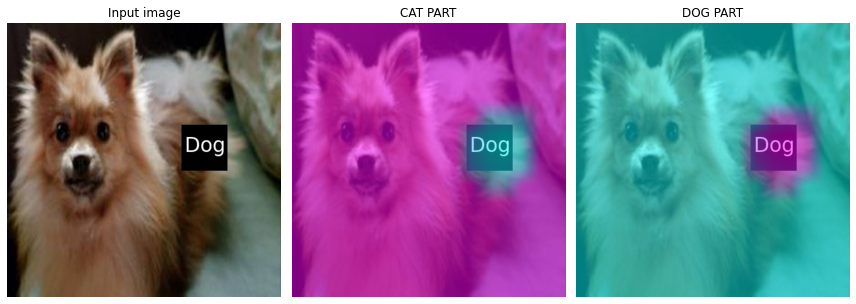

In [1477]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("Input image")
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow((ybar_threshed).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("CAT PART")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax3)
ax3.imshow((ybar_threshed2).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax3.set_title("DOG PART")
#
fig.set_figwidth(12)            
fig.set_figheight(12)
fig.tight_layout()

- 판단 근거가 강할 수록 파란색 -> 보라색

In [1478]:
a,b = net_r(x).tolist()[0]

In [1479]:
np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))

(6.840020369054416e-09, 0.9999999931599796)

## mode 1

In [1480]:
# test=camimg_o[0]-torch.min(camimg_o[0])
T = camimg[1]
A1=torch.exp(-0.05*(ybar_threshed2))
T1 = torch.exp(-0.05*T)
A2 = 1 - A1
T2 = 1 - T1

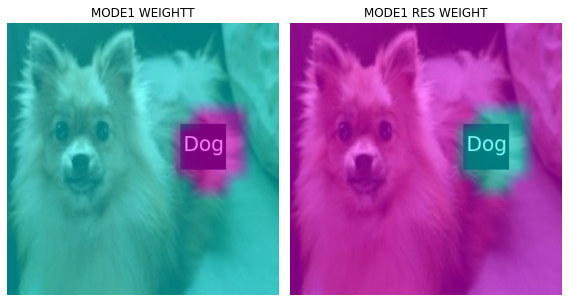

In [1481]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(A2.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("MODE1 WEIGHTT")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(A1.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("MODE1 RES WEIGHT")
#
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1482]:
# mode 1 res
X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1

# mode 1
X12=np.array(A2.to("cpu").detach(),dtype=np.float32)
Y12=torch.Tensor(cv2.resize(X12,(512,512),interpolation=cv2.INTER_LINEAR))
x12=x.squeeze().to('cpu')*Y12-torch.min(x.squeeze().to('cpu'))*Y12

`-` 1st CAM 분리

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


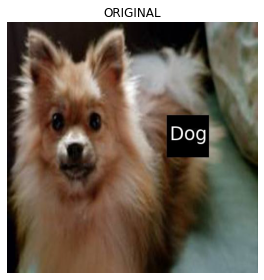

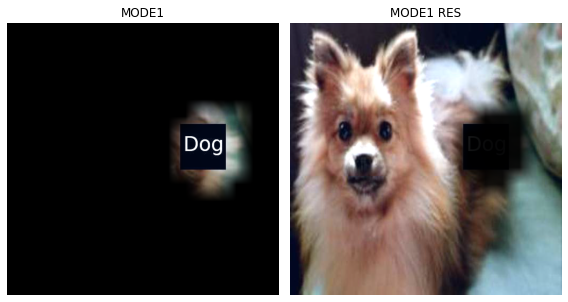

In [1483]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.3).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1484]:
x1 = x1.reshape(1,3,512,512)

In [1485]:
net_1.to('cpu')
net_2.to('cpu')

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [1486]:
camimg1 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x1).squeeze())

In [1487]:
a1,b1 = net_r(x1).tolist()[0]

In [1488]:
np.exp(a1)/ (np.exp(a1)+np.exp(b1)) ,  np.exp(b1)/ (np.exp(a1)+np.exp(b1))

(0.001180554413474461, 0.9988194455865255)

`-` mode1 res 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


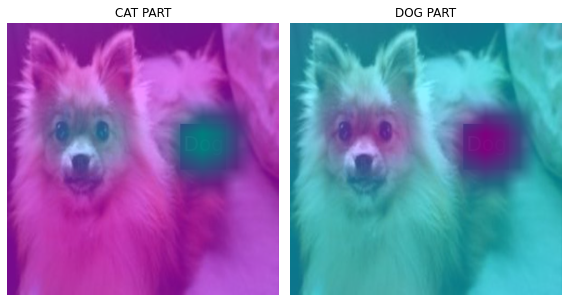

In [1489]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
(x1*0.25).squeeze().show(ax=ax1)
ax1.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
(x1*0.25).squeeze().show(ax=ax2)
ax2.imshow(camimg1[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

`-` 첫번째 CAM 결과와 비교

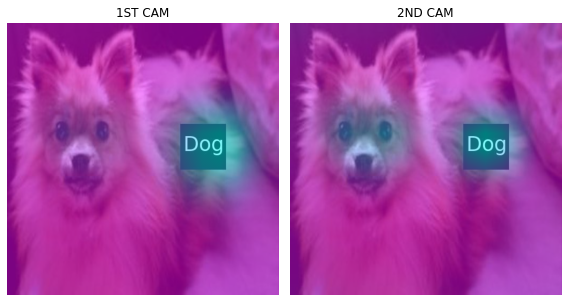

In [1490]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("1ST CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("2ND CAM")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

`-` 2nd CAM 분리

In [1491]:
test1=camimg1[1]-torch.min(camimg1[1])
A3 = torch.exp(-0.05*(test1))
A4 = 1 - A3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


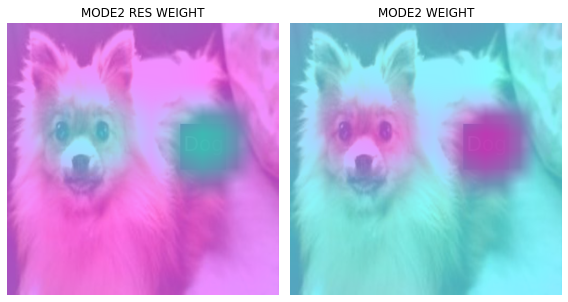

In [1492]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
x1.squeeze().show(ax=ax2)
dls_r.train.decode((x1,))[0].squeeze().show(ax=ax1)
ax1.imshow(A3.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("MODE2 RES WEIGHT")
#
x1.squeeze().show(ax=ax2)
dls_r.train.decode((x1,))[0].squeeze().show(ax=ax2)
ax2.imshow(A4.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("MODE2 WEIGHT")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1493]:
# res 
X2=np.array(A3.to("cpu").detach(),dtype=np.float32)
Y2=torch.Tensor(cv2.resize(X2,(512,512),interpolation=cv2.INTER_LINEAR))
x2=(x1*0.2)*Y2-torch.min((x1*0.2)*Y2)
#
X22=np.array(A4.to("cpu").detach(),dtype=np.float32)
Y22=torch.Tensor(cv2.resize(X22,(512,512),interpolation=cv2.INTER_LINEAR))
x22=(x1*0.2)*Y22-torch.min((x1*0.2)*Y22)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


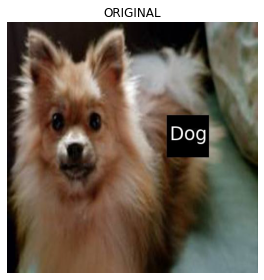

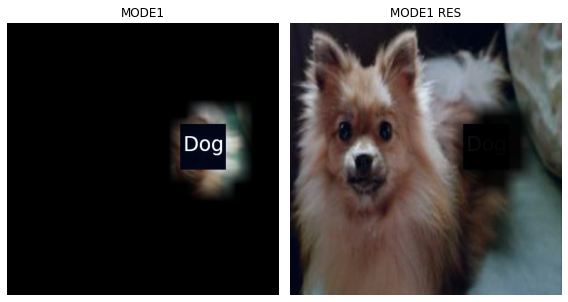

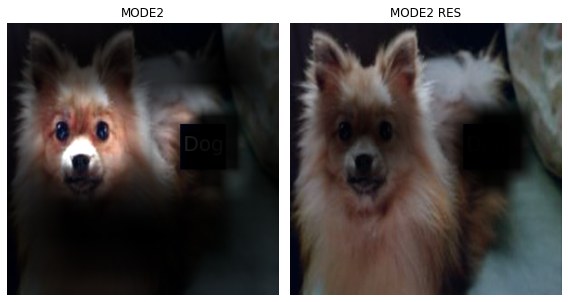

In [1494]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.2).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x22*3).squeeze().show(ax=ax1)  #MODE2
(x2).squeeze().show(ax=ax2)  #MODE2_res
ax1.set_title("MODE2")
ax2.set_title("MODE2 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1495]:
x2 = x2.reshape(1,3,512,512)

In [1496]:
net_1.to('cpu')
net_2.to('cpu')

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [1497]:
camimg2 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x2).squeeze())

In [1498]:
a2,b2 = net_r(x2).tolist()[0]
np.exp(a2)/(np.exp(a2)+np.exp(b2)), np.exp(b2)/(np.exp(a2)+np.exp(b2))

(0.48014948791345896, 0.5198505120865412)

`-` mode2 res 에 CAM 결과 올리기

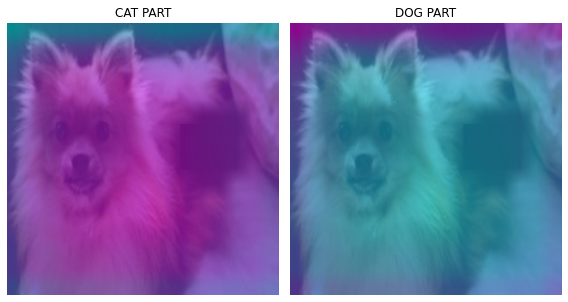

In [1499]:
fig, (ax1, ax2) = plt.subplots(1,2) 
#
x2.squeeze().show(ax=ax1)
ax1.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
x2.squeeze().show(ax=ax2)
ax2.imshow(camimg2[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

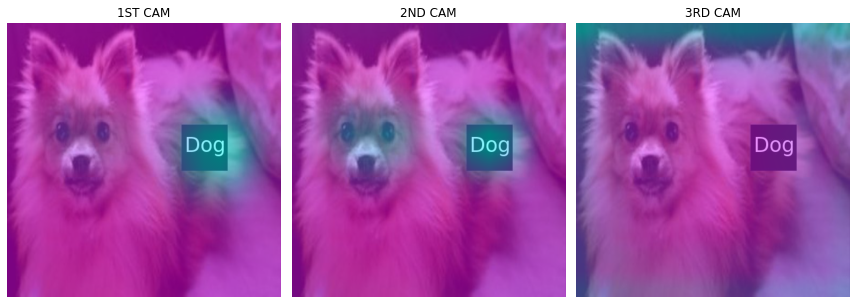

In [1500]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("1ST CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("2ND CAM")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax3)
ax3.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax3.set_title("3RD CAM")
fig.set_figwidth(12)            
fig.set_figheight(12)
fig.tight_layout()

## mode 3 만들기 더이상 분리되지 않는 듯

In [1501]:
test2=camimg2[1]-torch.min(camimg2[1])

In [1502]:
A5 = torch.exp(-0.05*(test2))

In [1503]:
A6 = 1 - A5

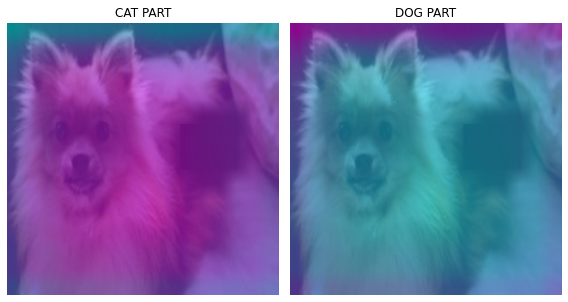

In [1504]:
fig, (ax1, ax2) = plt.subplots(1,2) 
#
x2.squeeze().show(ax=ax1)
ax1.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
x2.squeeze().show(ax=ax2)
ax2.imshow(camimg2[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [1505]:
#mode 3 res
X3=np.array(A5.to("cpu").detach(),dtype=np.float32)
Y3=torch.Tensor(cv2.resize(X3,(512,512),interpolation=cv2.INTER_LINEAR))
x3=x2*Y3-torch.min(x2*Y3)
# mode 3
X32=np.array(A6.to("cpu").detach(),dtype=np.float32)
Y32=torch.Tensor(cv2.resize(X32,(512,512),interpolation=cv2.INTER_LINEAR))
x32=x2*Y32-torch.min(x2*Y32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


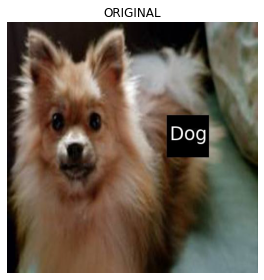

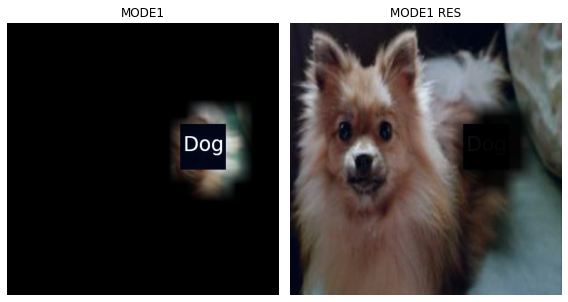

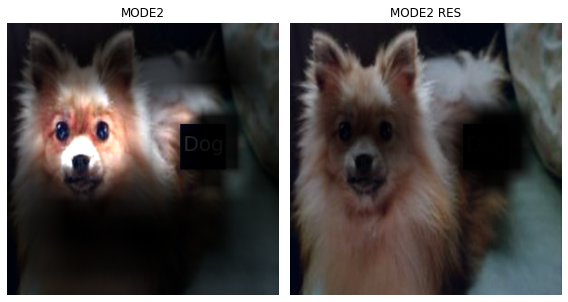

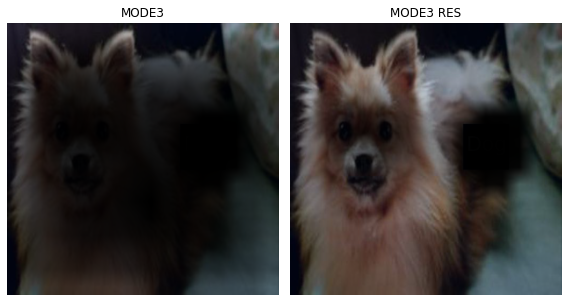

In [1506]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
(x1*0.2).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x22*4).squeeze().show(ax=ax1)  #MODE2
(x2).squeeze().show(ax=ax2)  #MODE2_res
ax1.set_title("MODE2")
ax2.set_title("MODE2 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x32*8).squeeze().show(ax=ax1)  #MODE3
(x3).squeeze().show(ax=ax2)  #MODE3_res
ax1.set_title("MODE3")
ax2.set_title("MODE3 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


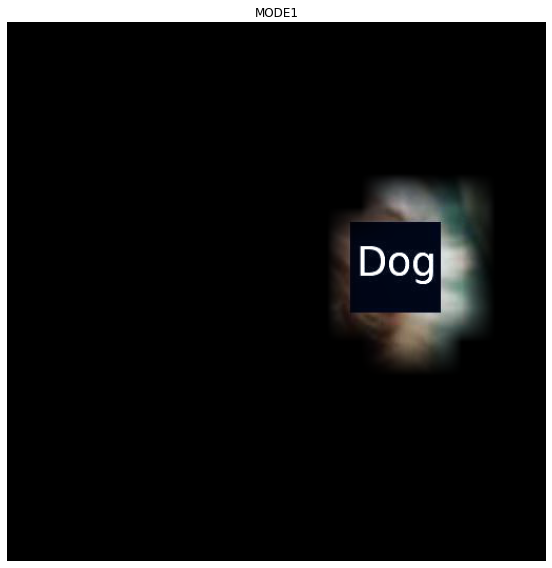

In [1507]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3).squeeze().show(ax=ax1)  #MODE1
ax1.set_title("MODE1")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


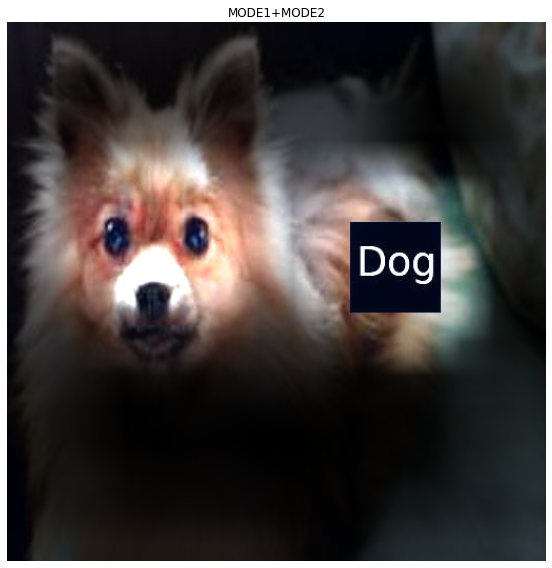

In [1511]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3 + x22*4).squeeze().show(ax=ax1)  #MODE1+MODE2
ax1.set_title("MODE1+MODE2")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


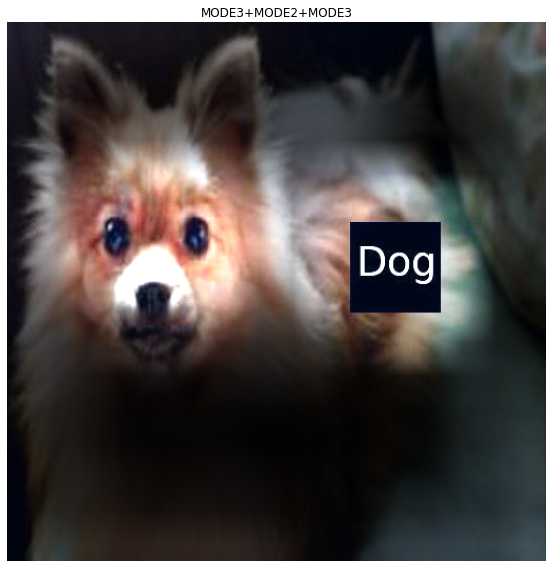

In [1512]:
fig, (ax1) = plt.subplots(1,1) 
(x12*0.3 + x22*4 + x32*2).squeeze().show(ax=ax1)  #MODE1+MODE2+MODE3
ax1.set_title("MODE3+MODE2+MODE3")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()